# wordslab-images - Replicate and OpenRouter

## replicate.com

https://replicate.com/docs/get-started/python

https://github.com/replicate/replicate-python#readme

In [2]:
!uv add replicate

Resolved 269 packages in 0.54ms
Audited 169 packages in 1ms


Generate an API token at https://replicate.com/account/api-tokens, copy the token, then set it as an environment variable:

In [4]:
import os
os.environ["REPLICATE_API_TOKEN"]="r8_K6AA..." # Be careful: DON'T push it to Github !

In [12]:
import replicate
from PIL import Image

def generate_image(prompt, model):
    output = replicate.run(
      model,
      input={"prompt": prompt}
    )
    try:
        file_output = output[0]
    except:
        file_output = output
    return Image.open(file_output)

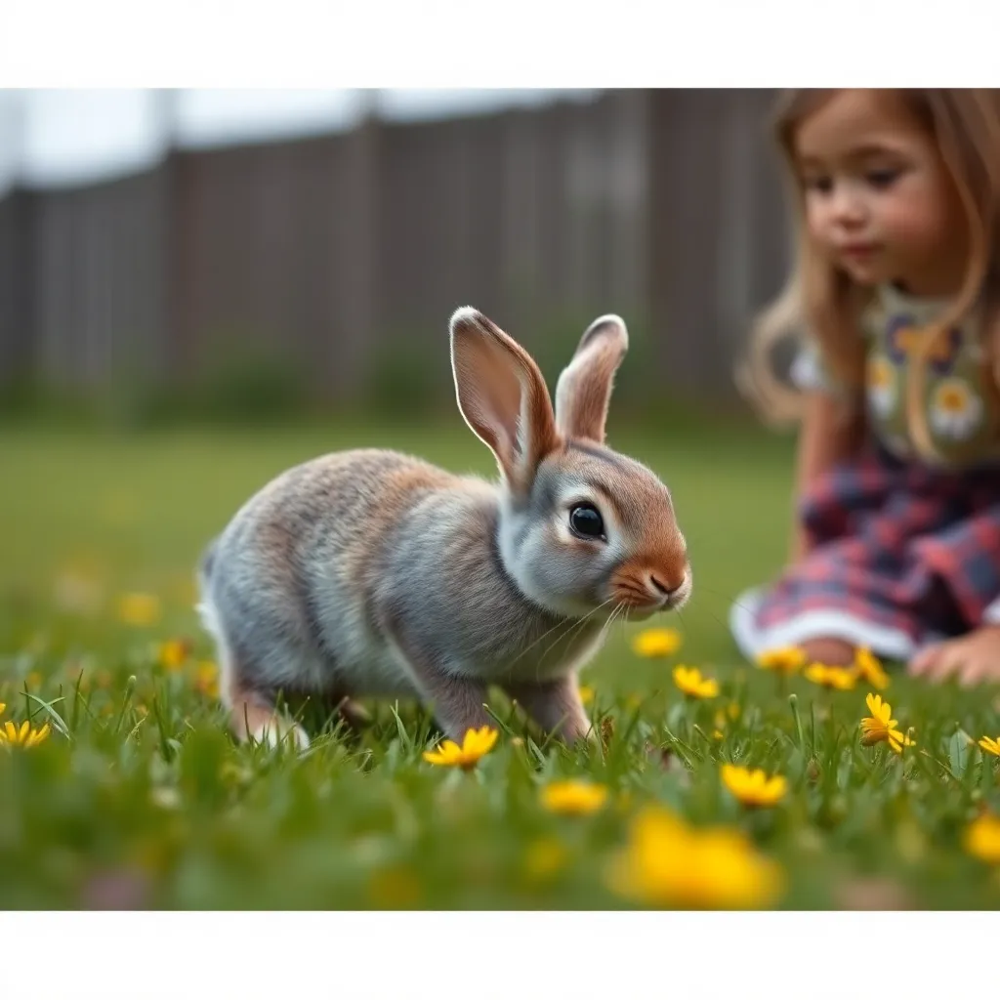

In [9]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "black-forest-labs/flux-schnell")

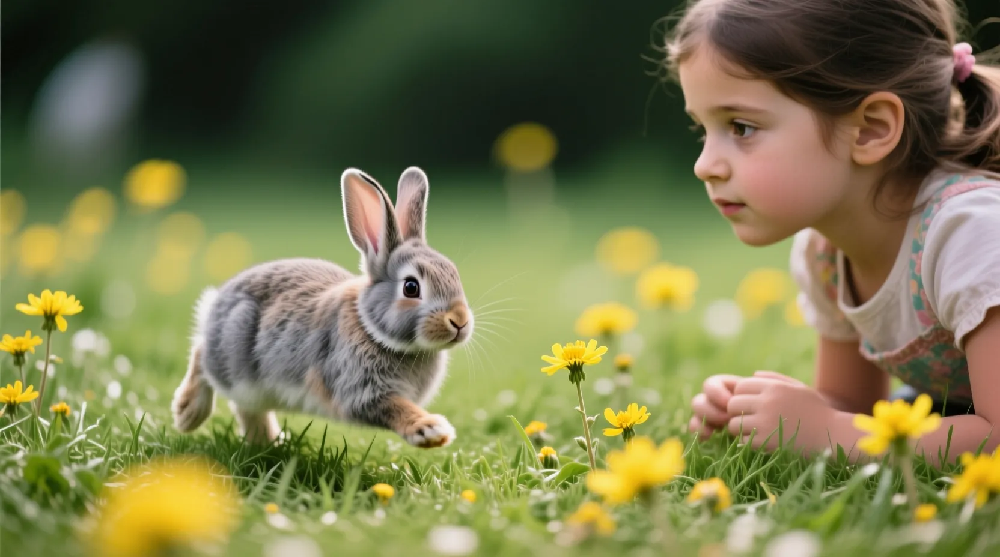

In [14]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "qwen/qwen-image")

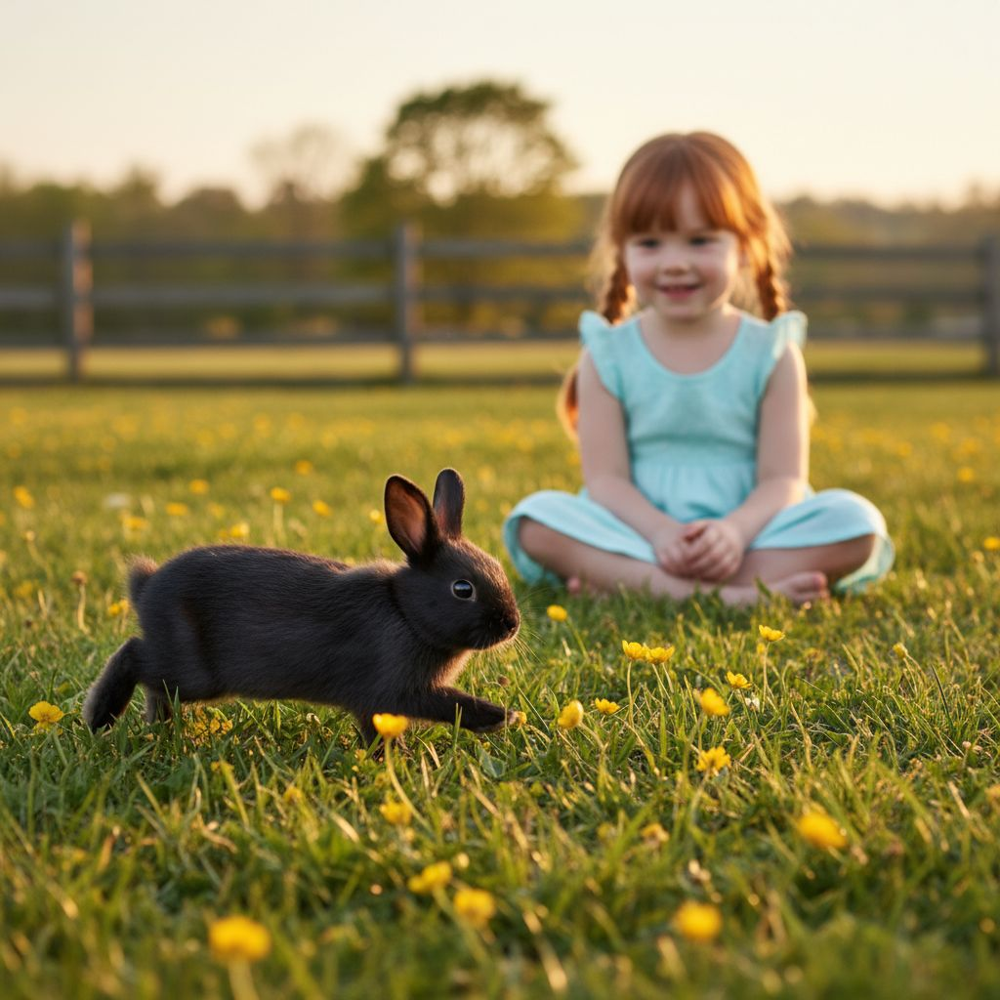

In [13]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "google/nano-banana")

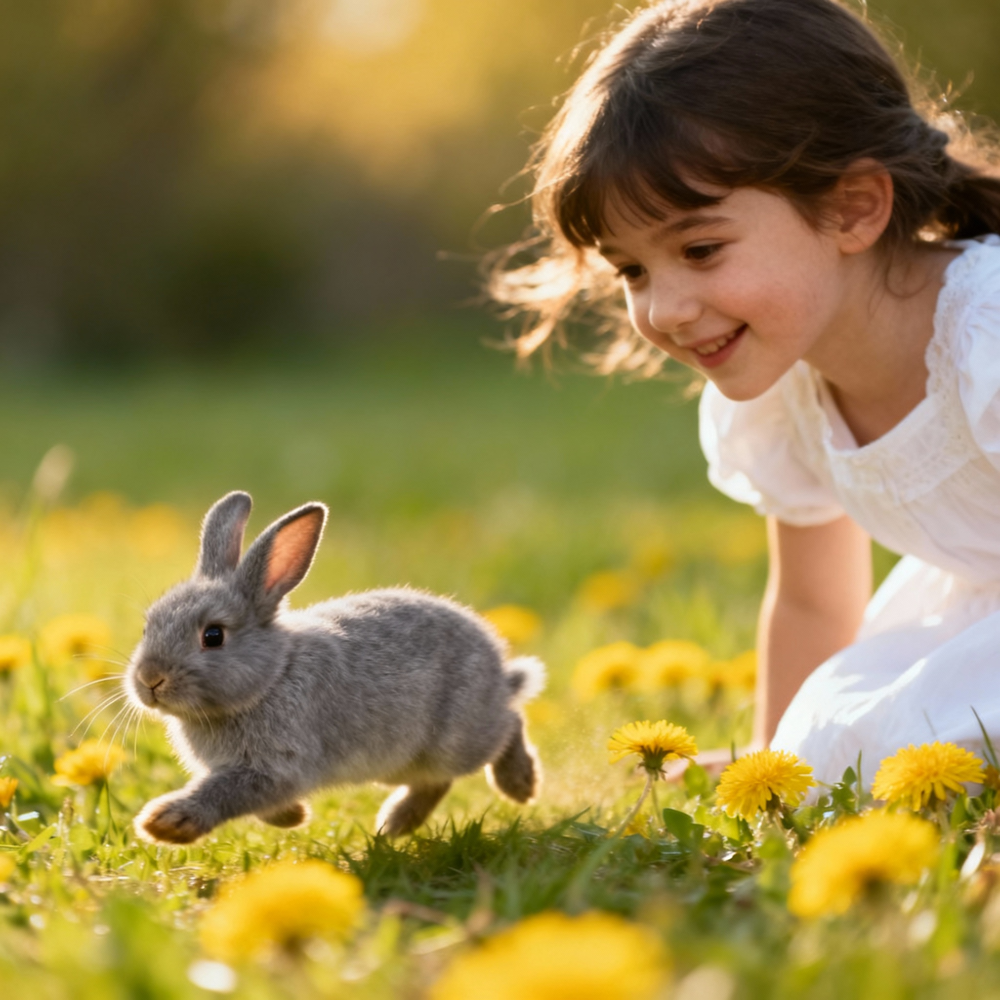

In [15]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "bytedance/seedream-4")

## openrouter.ai

https://openrouter.ai/docs/features/multimodal/image-generation

Generate an API token at https://openrouter.ai/settings/keys, copy the token, then set it as an Python variable:

In [17]:
OPENROUTER_API_KEY = "sk-or-v1-7a77..." # Be careful: DON'T push it to Github !

In [19]:
import base64
from io import BytesIO
from PIL import Image

def data_url_to_image(data_url: str) -> Image.Image:
    # Split the header from the base64 data
    header, encoded = data_url.split(',', 1)
    # Decode the base64 string
    image_data = base64.b64decode(encoded)
    # Create a BytesIO buffer and open it with PIL
    return Image.open(BytesIO(image_data))

In [20]:
import requests
import json

url = "https://openrouter.ai/api/v1/chat/completions"
headers = {
    "Authorization": f"Bearer {OPENROUTER_API_KEY}",
    "Content-Type": "application/json"
}

def generate_image(prompt, model):
    payload = {
        "model": model,
        "messages": [
            {
                "role": "user",
                "content": prompt
            }
        ],
        "modalities": ["image", "text"],
        "image_config": {
            "aspect_ratio": "16:9"
        }
    }
    response = requests.post(url, headers=headers, json=payload)
    result = response.json()
    if result.get("choices"):
        message = result["choices"][0]["message"]
        if message.get("images"):
            for image in message["images"]:
                image_url = image["image_url"]["url"]
                return data_url_to_image(image_url)

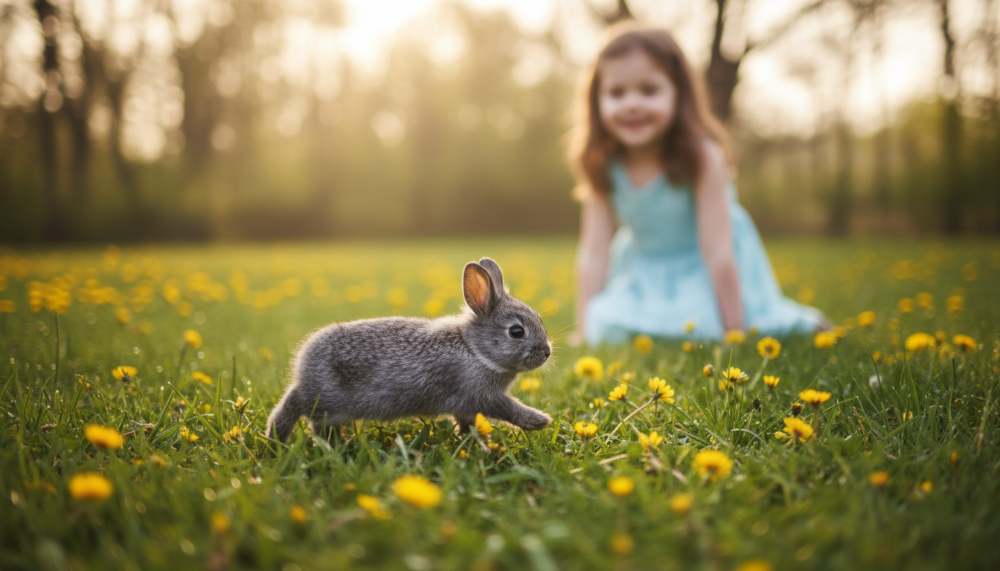

In [21]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "google/gemini-2.5-flash-image")

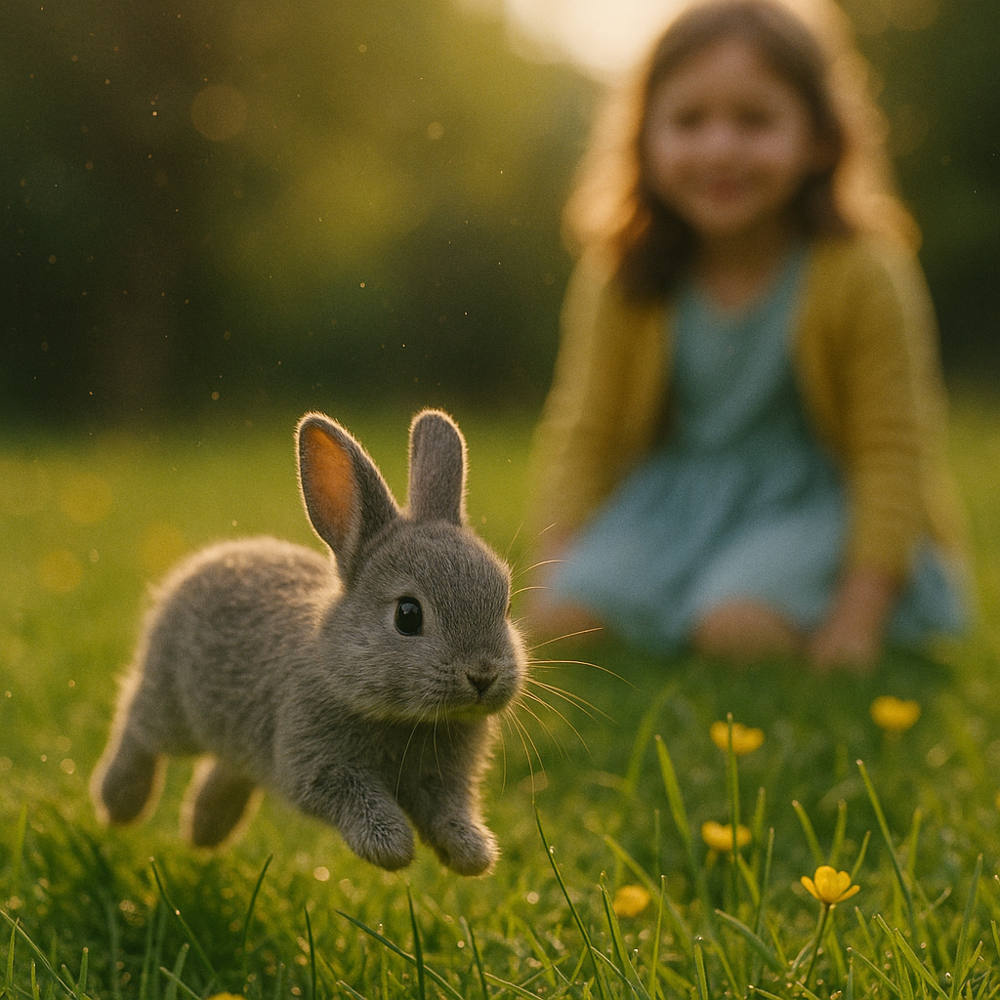

In [22]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "openai/gpt-5-image")

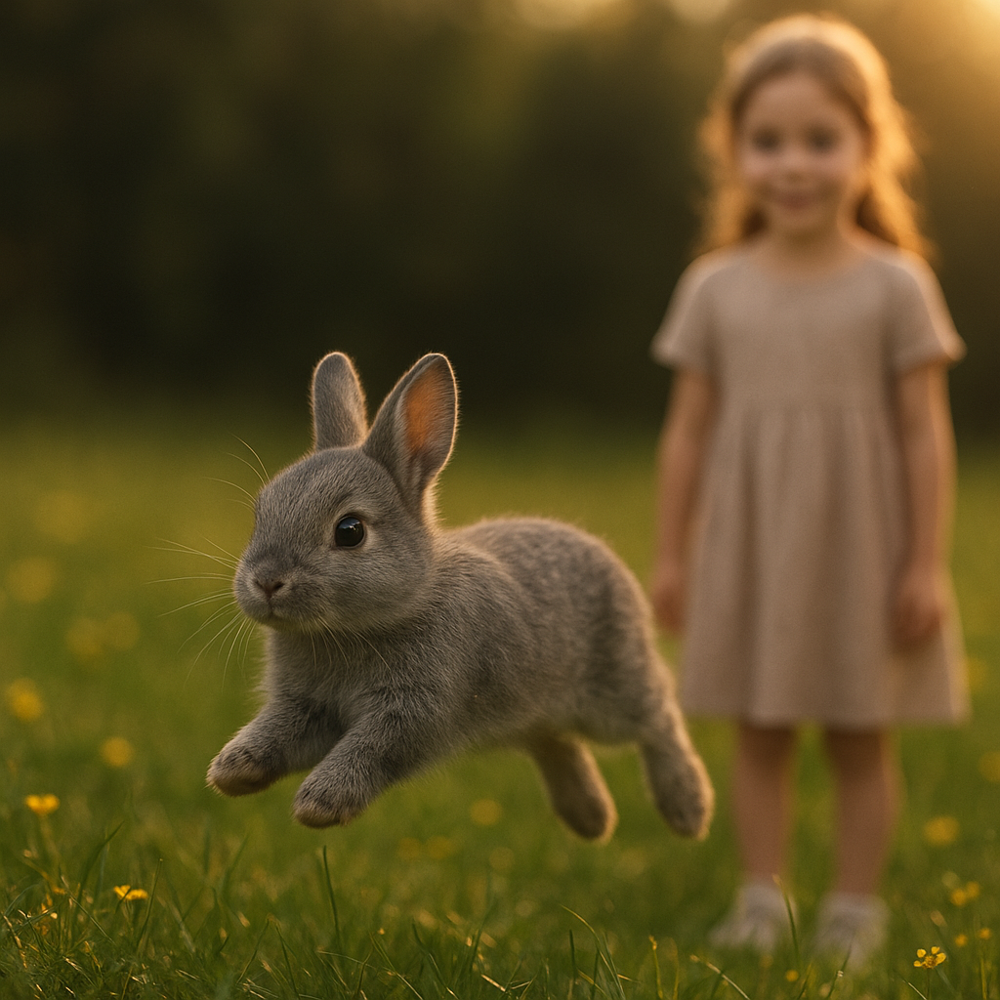

In [23]:
generate_image("A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot", 
                "openai/gpt-5-image-mini")